In [95]:
import pandas as pd
import numpy as np
import os
import librosa
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from concurrent.futures import ProcessPoolExecutor
import pickle
import gzip
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns
from sklearn.svm import SVC  
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

In [72]:
pip install lightgbm

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ------- -------------------------------- 0.3/1.4 MB ? eta -:--:--
   --------------------- ------------------ 0.8/1.4 MB 2.8 MB/s eta 0:00:01
   ----------------------------- ---------- 1.0/1.4 MB 2.0 MB/s eta 0:00:01
   ---------------------------------------- 1.4/1.4 MB 2.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:


# Function to extract audio features
def extract_audio_features(file_path):
    # Load audio file
    y, sr = librosa.load(file_path, sr=None)
    
    # Extract features
    features = {
        'chroma_stft_mean': np.mean(librosa.feature.chroma_stft(y=y, sr=sr)),
        'chroma_stft_var': np.var(librosa.feature.chroma_stft(y=y, sr=sr)),
        'rms_mean': np.mean(librosa.feature.rms(y=y)),
        'rms_var': np.var(librosa.feature.rms(y=y)),
        'spectral_centroid_mean': np.mean(librosa.feature.spectral_centroid(y=y, sr=sr)),
        'spectral_centroid_var': np.var(librosa.feature.spectral_centroid(y=y, sr=sr)),
        'spectral_bandwidth_mean': np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr)),
        'spectral_bandwidth_var': np.var(librosa.feature.spectral_bandwidth(y=y, sr=sr)),
        'rolloff_mean': np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr)),
        'rolloff_var': np.var(librosa.feature.spectral_rolloff(y=y, sr=sr)),
        'zero_crossing_rate_mean': np.mean(librosa.feature.zero_crossing_rate(y=y)),
        'zero_crossing_rate_var': np.var(librosa.feature.zero_crossing_rate(y=y)),
        'harmony_mean': np.mean(librosa.effects.harmonic(y=y)),
        'harmony_var': np.var(librosa.effects.harmonic(y=y)),
        'perceptr_mean': np.mean(librosa.effects.percussive(y=y)),
        'perceptr_var': np.var(librosa.effects.percussive(y=y)),
        'tempo': librosa.beat.tempo(y=y, sr=sr)[0],
    }
    
    # Extract MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
    for i in range(20):
        features[f'mfcc{i+1}_mean'] = np.mean(mfccs[i])
        features[f'mfcc{i+1}_var'] = np.var(mfccs[i])
    
    return features

# Example usage
# file_path = 'path/to/your/audio/file.wav'  # Replace with the path to your audio file
# features = extract_audio_features(file_path)

# # Convert to DataFrame for better visualization
# df = pd.DataFrame([features])
# print(df)


In [132]:
file_path_new="C:\\Users\\leech\\OneDrive\\Desktop\\ML_project\\genres_original"

In [ ]:


# Initialize feature and label lists
features4 = []
labels4 = []

# Loop through each class in the directory
for class_name in os.listdir(file_path_new):
    class_path = os.path.join(file_path_new, class_name)
    
    if not os.path.isdir(class_path):  # Ensure we are processing directories (classes)
        continue
    
    print(f"Starting for class '{class_name}'")
    count = 0
    
    # Loop through each audio file in the class directory
    for audio_file in os.listdir(class_path):
        audio_path = os.path.join(class_path, audio_file)
        
        if not audio_file.lower().endswith(('.wav', '.mp3')):  # Process only audio files
            continue
        
        print(f"Processing audio file {count + 1}: {audio_file}")
        
        try:
            # Extract features and append to lists
            feature = extract_audio_features(audio_path)
            features4.append(feature)
            labels4.append(class_name)
        except Exception as e:
            print(f"Error processing file {audio_file}: {e}")
        
        count += 1
    
    print(f"Done processing for class '{class_name}', total files processed: {count}")
    print()

print("Feature extraction completed.")


Starting for class 'blues'
Processing audio file 1: blues.00000.wav


C:\Users\leech\AppData\Local\Temp\ipykernel_16936\541747503.py:24: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  'tempo': librosa.beat.tempo(y=y, sr=sr)[0],


Processing audio file 2: blues.00001.wav
Processing audio file 3: blues.00002.wav
Processing audio file 4: blues.00003.wav
Processing audio file 5: blues.00004.wav
Processing audio file 6: blues.00005.wav
Processing audio file 7: blues.00006.wav
Processing audio file 8: blues.00007.wav
Processing audio file 9: blues.00008.wav
Processing audio file 10: blues.00009.wav
Processing audio file 11: blues.00010.wav
Processing audio file 12: blues.00011.wav
Processing audio file 13: blues.00012.wav
Processing audio file 14: blues.00013.wav
Processing audio file 15: blues.00014.wav
Processing audio file 16: blues.00015.wav
Processing audio file 17: blues.00016.wav
Processing audio file 18: blues.00017.wav
Processing audio file 19: blues.00018.wav
Processing audio file 20: blues.00019.wav
Processing audio file 21: blues.00020.wav
Processing audio file 22: blues.00021.wav
Processing audio file 23: blues.00022.wav
Processing audio file 24: blues.00023.wav
Processing audio file 25: blues.00024.wav


C:\Users\leech\AppData\Local\Temp\ipykernel_16936\541747503.py:4: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(file_path, sr=None)
C:\Users\leech\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Processing audio file 57: jazz.00056.wav
Processing audio file 58: jazz.00057.wav
Processing audio file 59: jazz.00058.wav
Processing audio file 60: jazz.00059.wav
Processing audio file 61: jazz.00060.wav
Processing audio file 62: jazz.00061.wav
Processing audio file 63: jazz.00062.wav
Processing audio file 64: jazz.00063.wav
Processing audio file 65: jazz.00064.wav
Processing audio file 66: jazz.00065.wav
Processing audio file 67: jazz.00066.wav
Processing audio file 68: jazz.00067.wav
Processing audio file 69: jazz.00068.wav
Processing audio file 70: jazz.00069.wav
Processing audio file 71: jazz.00070.wav
Processing audio file 72: jazz.00071.wav
Processing audio file 73: jazz.00072.wav
Processing audio file 74: jazz.00073.wav
Processing audio file 75: jazz.00074.wav
Processing audio file 76: jazz.00075.wav
Processing audio file 77: jazz.00076.wav
Processing audio file 78: jazz.00077.wav
Processing audio file 79: jazz.00078.wav
Processing audio file 80: jazz.00079.wav
Processing audio

In [3]:
def save_features(features, filename):
    # Open a gzip file in write-binary mode
    with gzip.open(filename, 'wb') as file:
        # Use pickle to dump the features into the file
        pickle.dump(features, file)
    print(f"Features saved and compressed to {filename}")

def load_features(filename):
    # Open a gzip file in read-binary mode
    with gzip.open(filename, 'rb') as file:
        # Use pickle to load the features from the file
        features = pickle.load(file)
    print(f"Features loaded from {filename}")
    return features

In [4]:
save_features(labels4,"labels4.pkl.gz")
save_features(features4,"features4.pkl.gz")

NameError: name 'labels4' is not defined

In [5]:
features4=load_features("features4.pkl.gz")
labels4=load_features("labels4.pkl.gz")

Features loaded from features4.pkl.gz
Features loaded from labels4.pkl.gz


In [6]:
print(features4)

[[ 3.50128502e-01  8.87716636e-02  1.30184323e-01 ...  5.50536537e+01
   1.22246706e+00  4.69413490e+01]
 [ 3.40849400e-01  9.49761793e-02  9.59078223e-02 ...  5.11060143e+01
   5.30644357e-01  4.57887001e+01]
 [ 3.63537729e-01  8.52566436e-02  1.75473213e-01 ...  4.66433945e+01
  -2.23812771e+00  3.06531506e+01]
 ...
 [ 4.31980252e-01  7.52206743e-02  8.15977529e-02 ...  4.25071068e+01
  -2.10432506e+00  2.98609943e+01]
 [ 3.62635195e-01  9.15315375e-02  8.38023946e-02 ...  4.71723175e+01
  -3.58759904e+00  4.12963600e+01]
 [ 3.58318061e-01  8.58170018e-02  5.44314981e-02 ...  7.21698685e+01
   1.15010834e+00  4.97351379e+01]]


In [7]:
print(features4)
print(labels4)

[[ 3.50128502e-01  8.87716636e-02  1.30184323e-01 ...  5.50536537e+01
   1.22246706e+00  4.69413490e+01]
 [ 3.40849400e-01  9.49761793e-02  9.59078223e-02 ...  5.11060143e+01
   5.30644357e-01  4.57887001e+01]
 [ 3.63537729e-01  8.52566436e-02  1.75473213e-01 ...  4.66433945e+01
  -2.23812771e+00  3.06531506e+01]
 ...
 [ 4.31980252e-01  7.52206743e-02  8.15977529e-02 ...  4.25071068e+01
  -2.10432506e+00  2.98609943e+01]
 [ 3.62635195e-01  9.15315375e-02  8.38023946e-02 ...  4.71723175e+01
  -3.58759904e+00  4.12963600e+01]
 [ 3.58318061e-01  8.58170018e-02  5.44314981e-02 ...  7.21698685e+01
   1.15010834e+00  4.97351379e+01]]
['blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'blues', 'bl

In [8]:
X_train, X_test, y_train, y_test = train_test_split(features4, labels4, test_size=0.2, random_state=42)

In [9]:
# scaled_features=features
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)

scaler=StandardScaler()
X_test_scaled=scaler.fit_transform(X_test)


Here we are doing pcs to identify important features because it ranks features based on the amount of varience they capture in the data.
It projects the higher dimensional data into lower dimensional space while retaining as much information as possible. With each subsequent 
principal component the captured varience is less. This is for the initial 6 features that we extracted.

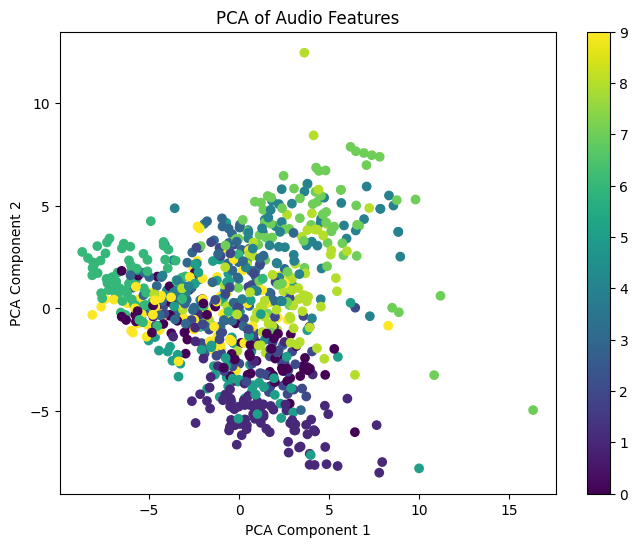

In [158]:


# Reduce features to 2 dimensions using PCA
label_encoder = LabelEncoder()
y_train_int=label_encoder.fit_transform(y_train)
# print(labels4_int)
# labels_numeric = np.array(labels4_int, dtype=int)
# for i in labels_numeric:
#     if (i==10):
#         print("yes")
    # print(i)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_train_scaled)

# Plot the 2D PCA result
plt.figure(figsize=(8, 6))
scatter = plt.scatter(pca_result[:, 0], pca_result[:, 1], c=y_train_int, cmap='viridis')
plt.colorbar(scatter)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Audio Features')
plt.show()


tSNE is also a way to represent higher dimensional data in 2-D or 3-D. It ensures that points that are closer in the higher dimensional space 
shall also remain close in the lower dimensional space. This for the initial 6 features that we extracted.

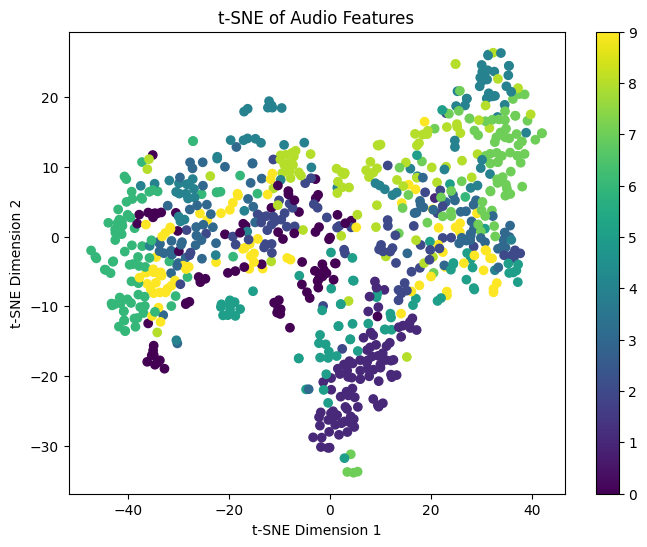

In [161]:


# Reduce features to 2 dimensions using t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(X_train_scaled)

# Plot the 2D t-SNE result
plt.figure(figsize=(8, 6))
scatter = plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=y_train_int, cmap='viridis')
plt.colorbar(scatter)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE of Audio Features')
plt.show()


Kmeans clustering is a type of unsupervised learning algorithm that makes groups of data point into predefined clusters. Each cluster is defined
by the centroid of all the points in that cluster. It helps to tell us if natural classes is present in our data or not and how well are the clusters seperated from each other. This is for the initial 6 features that we extracted.

Silhouette Score: 0.43


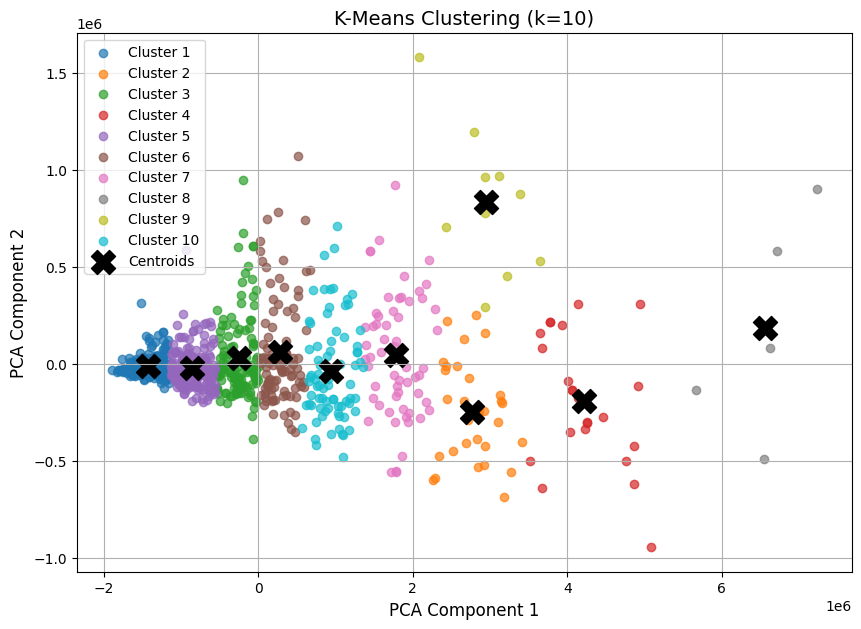

In [163]:

 
# # Apply K-Means clustering
# kmeans = KMeans(n_clusters=19, random_state=42)
# kmeans.fit(features4)

# # Calculate Silhouette Score
# score = silhouette_score(features4, kmeans.labels_)
# print(f'Silhouette Score: {score:.2f}')



import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# Example dataset (replace 'features4' with your dataset)
# Assuming features4 is a NumPy array or a DataFrame with numerical features
# features4 = np.random.rand(100, 5)  # Example data
# features4 = np.array(features4)  # Ensure it is a NumPy array

# Apply K-Means clustering
n_clusters = 10  # Specify the number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X_train)

# Calculate Silhouette Score
score = silhouette_score(X_train, kmeans.labels_)
print(f'Silhouette Score: {score:.2f}')

# Reduce dimensions to 2D for visualization using PCA
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(X_train)

# Scatter plot of the clusters
plt.figure(figsize=(10, 7))
for cluster in range(n_clusters):
    cluster_points = reduced_features[kmeans.labels_ == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster+1}', alpha=0.7)

# Plot the centroids
centroids = pca.transform(kmeans.cluster_centers_)
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='black', marker='X', label='Centroids')

# Add plot details
plt.title(f'K-Means Clustering (k={n_clusters})', fontsize=14)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.legend()
plt.grid()
plt.show()


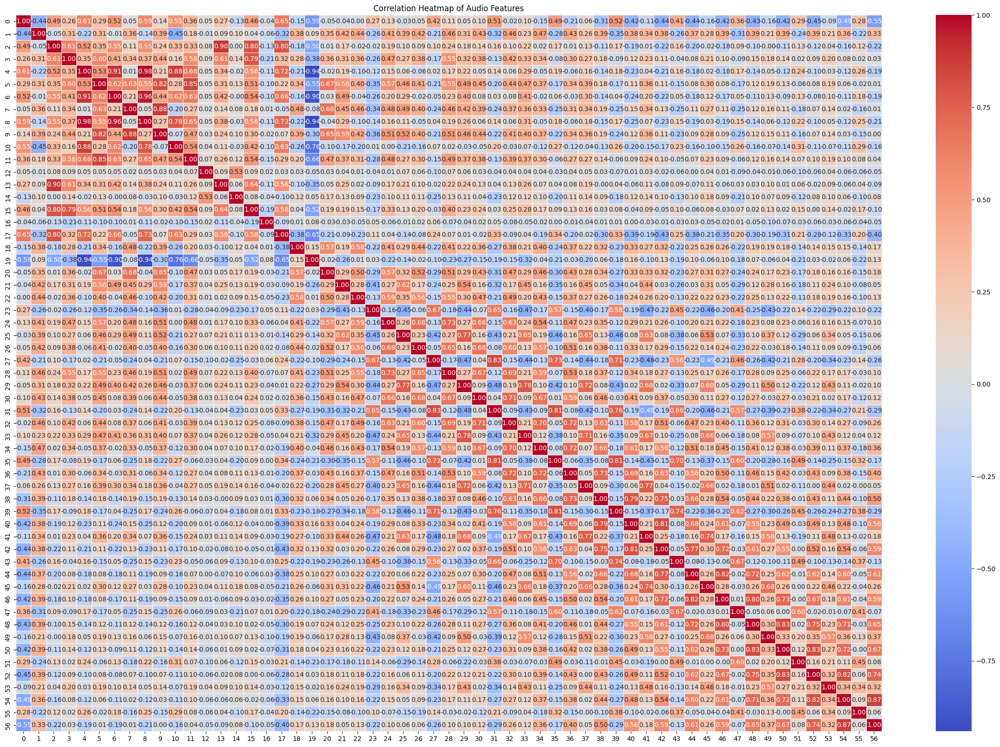

In [165]:
correlation_matrix = np.corrcoef(X_train, rowvar=False)

# Plot the heatmap
plt.figure(figsize=(30, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Audio Features")
plt.show()

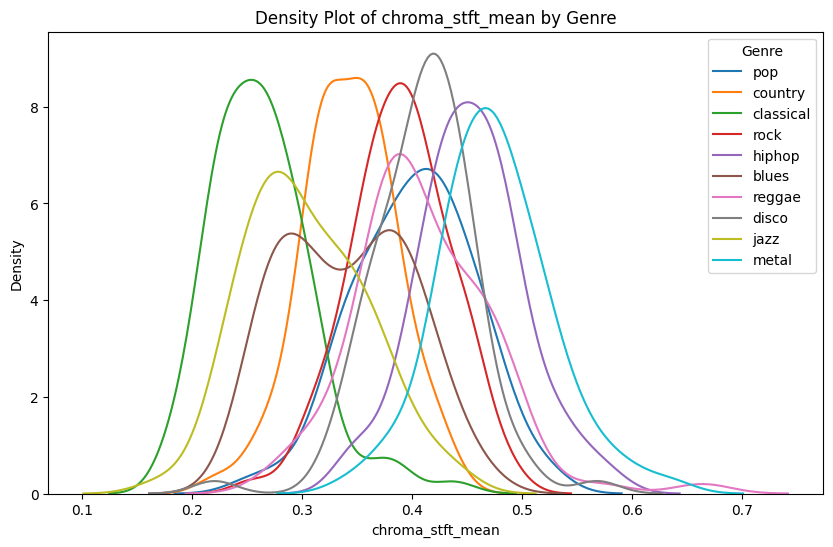

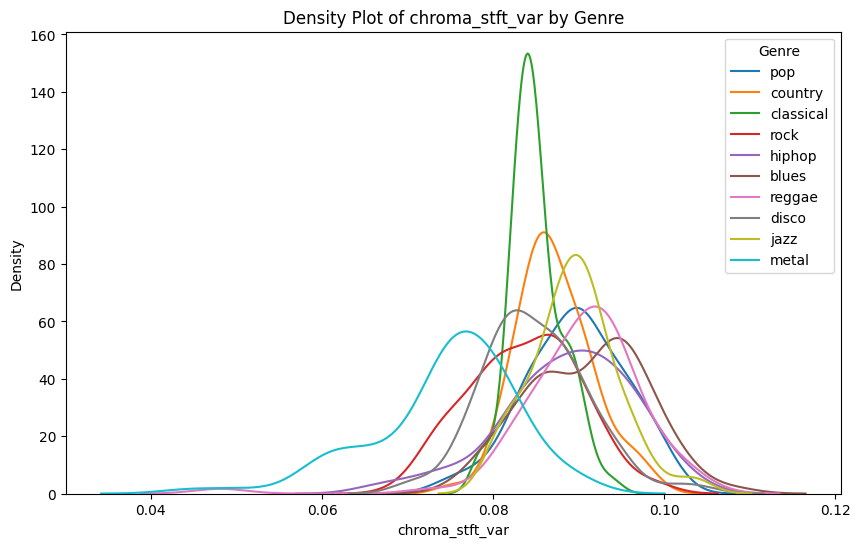

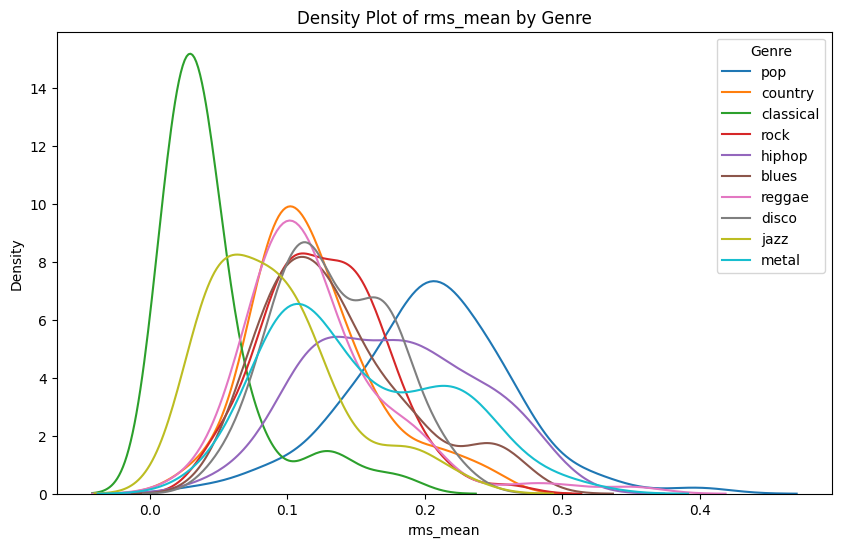

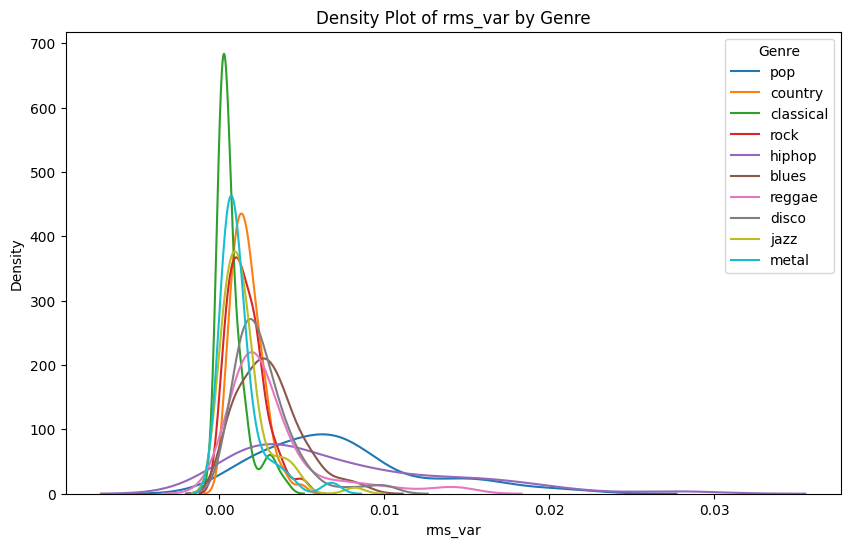

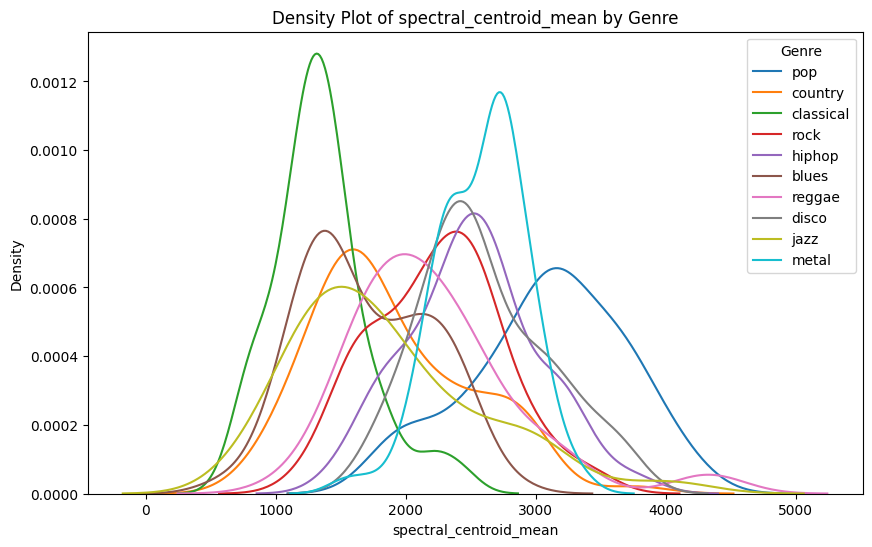

...

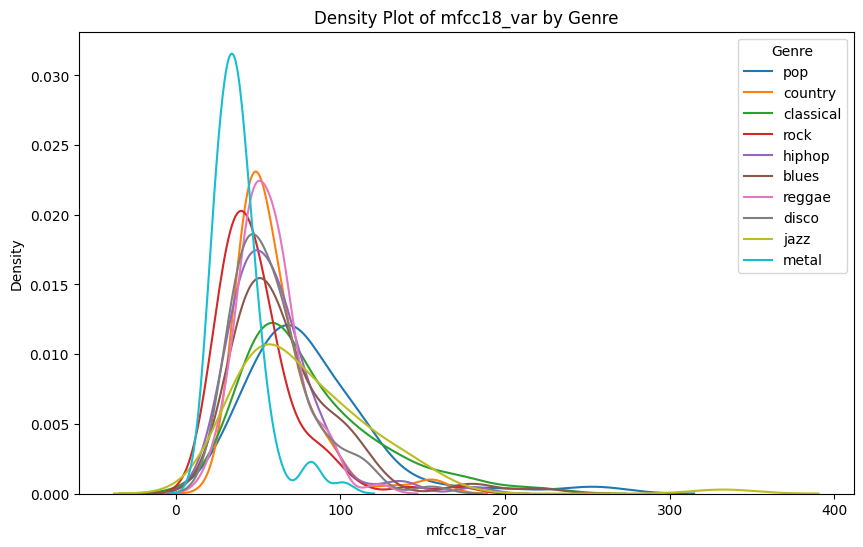

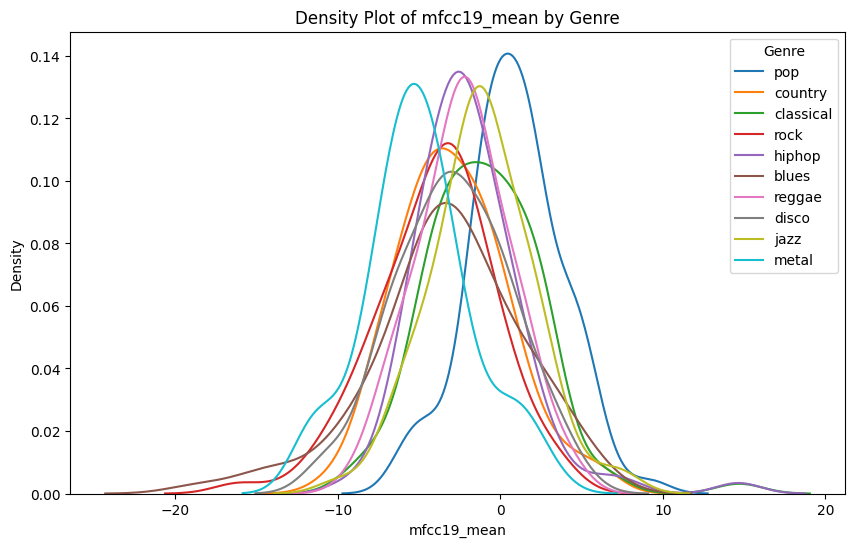

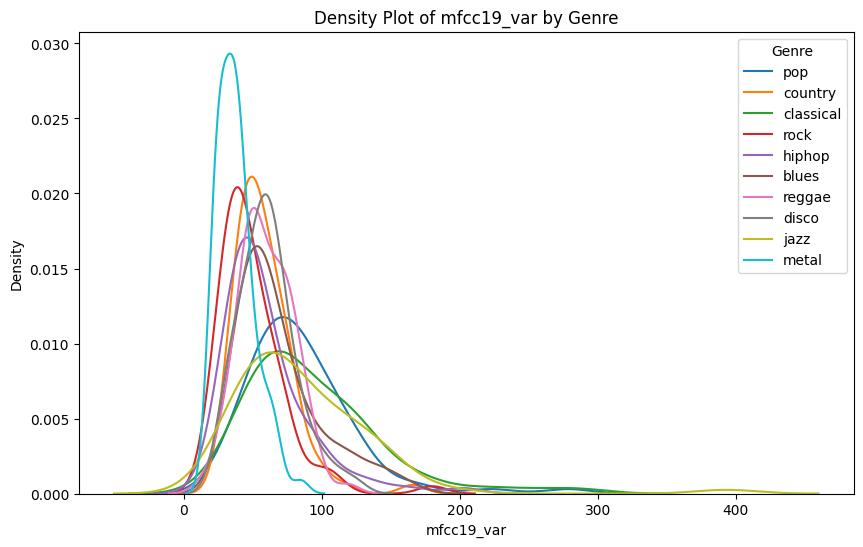

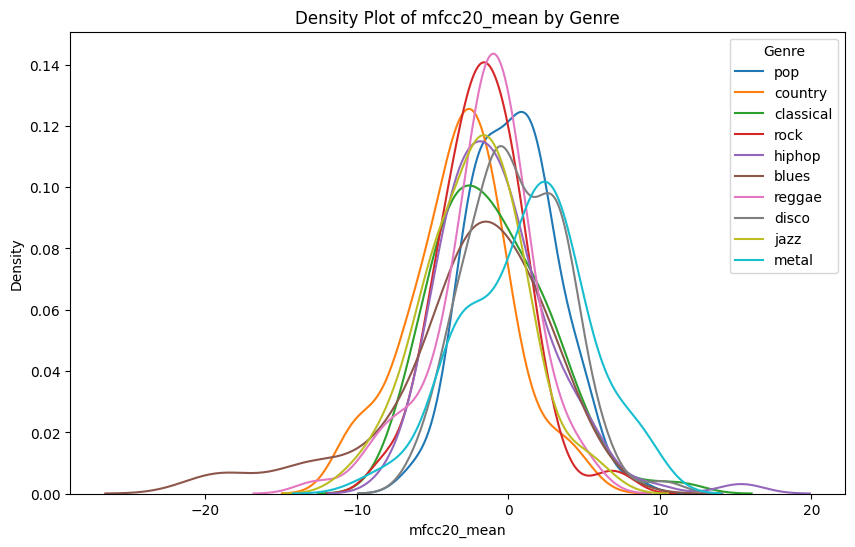

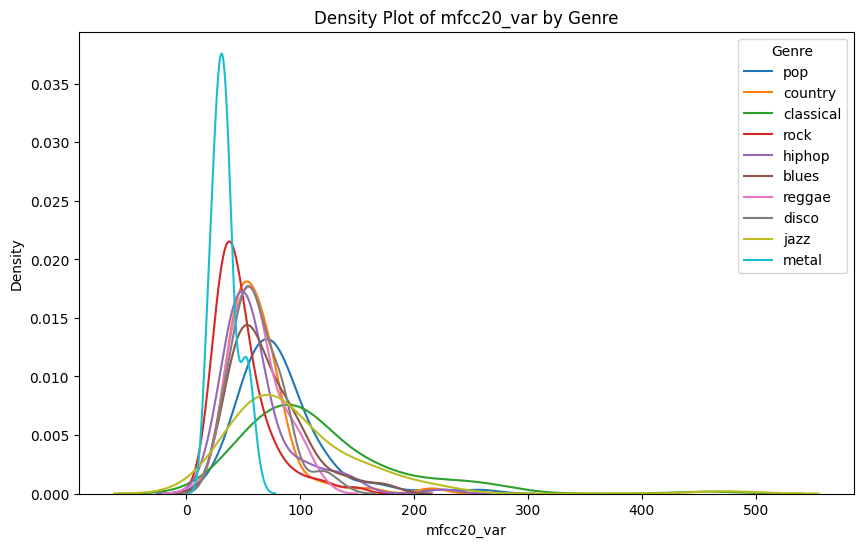

In [166]:


# Sample feature array and labels for demonstration
# Assuming features_array is (n_samples, 35) and labels is (n_samples,)
# Replace this with your actual data
# features_array = np.random.rand(100, 35)
# labels = np.random.randint(0, 3, size=100)  # Assuming 3 classes

# mfcc_mean, chroma_mean, spectral_contrast_mean,
#                                 zero_crossings_mean, rms_mean, spectral_bandwidth_mean

# Creating feature names based on your pattern
feature_names = (
    ["chroma_stft_mean","chroma_stft_var"]+
    ["rms_mean","rms_var"]+
    ["spectral_centroid_mean","spectral_centroid_var"]+
    ["spectral_bandwidth_mean","spectral_bandwidth_var"]+
    ["rolloff_mean","rolloff_var"]+
    ["zero_crossing_rate_mean","zero_crossing_rate_var"]+
    ["harmony_mean","harmony_var"]+
    ["perceptr_mean","perceptr_var"]+
    ["tempo"]+
    ["mfcc1_mean","mfcc1_var","mfcc2_mean","mfcc2_var","mfcc3_mean","mfcc3_var","mfcc4_mean","mfcc4_var","mfcc5_mean","mfcc5_var","mfcc6_mean","mfcc6_var","mfcc7_mean","mfcc7_var","mfcc8_mean","mfcc8_var","mfcc9_mean","mfcc9_var","mfcc10_mean","mfcc10_var","mfcc11_mean","mfcc11_var","mfcc12_mean","mfcc12_var","mfcc13_mean","mfcc13_var","mfcc14_mean","mfcc14_var","mfcc15_mean","mfcc15_var","mfcc16_mean","mfcc16_var","mfcc17_mean","mfcc17_var","mfcc18_mean","mfcc18_var","mfcc19_mean","mfcc19_var","mfcc20_mean","mfcc20_var"]
)

# Convert the NumPy array to a DataFrame with these feature names
features_df = pd.DataFrame(X_train, columns=feature_names)

# Add the class labels as a new column
features_df['class'] = y_train

# Plotting each feature by class
for feature in features_df.columns[:-1]:  # Exclude the 'class' column
    plt.figure(figsize=(10, 6))
    
    # Plot KDE for each class without filling
    for genre in features_df['class'].unique():
        sns.kdeplot(data=features_df[features_df['class'] == genre], x=feature, label=genre, fill=False)
    
    # Set plot title and labels
    plt.title(f"Density Plot of {feature} by Genre")
    plt.xlabel(feature)
    plt.ylabel("Density")
    plt.legend(title='Genre')
    plt.show()

In [37]:


# Initialize the OneHotEncoder
label_encoder = LabelEncoder()

# Fit and transform the labels
# one_hot_encoded = encoder.fit_transform(labels4.reshape(-1, 1))
y_train1=np.array(y_train)
y_test1=np.array(y_test)
y_train1=label_encoder.fit_transform(y_train1.reshape(-1,1))
y_test1=label_encoder.fit_transform(y_test1.reshape(-1,1))

C:\Users\leech\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\leech\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
print(labels4)

In [52]:
# scaled_features=features
scaler=MinMaxScaler()
scaled_features1=scaler.fit_transform(X_train)

scaler=MinMaxScaler()
scaled_features1=scaler.fit_transform(X_test)

In [38]:
pca = PCA(n_components=2)
X_train = pca.fit_transform(X_train)

pca = PCA(n_components=2)
X_test = pca.fit_transform(X_test)

In [148]:
pca = PCA(n_components=2)
pca_result_train = pca.fit_transform(X_train_scaled)

In [149]:
pca = PCA(n_components=2)
pca_result_test = pca.fit_transform(X_test_scaled)

In [154]:
rf_classifier = RandomForestClassifier(n_estimators=1000, max_depth=30, random_state=42)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)

# Evaluate Random Forest
print("Random Forest Classifier Results:")
print("Accuracy:", 100*accuracy_score(y_test, rf_predictions))
print("Classification Report:\n", classification_report(y_test, rf_predictions))

Random Forest Classifier Results:
Accuracy: 78.5
Classification Report:
               precision    recall  f1-score   support

       blues       0.80      0.76      0.78        21
   classical       0.80      1.00      0.89        12
     country       0.69      0.75      0.72        24
       disco       0.74      0.64      0.68        22
      hiphop       0.75      0.80      0.77        15
        jazz       1.00      0.93      0.96        27
       metal       0.75      1.00      0.86        18
         pop       0.94      0.84      0.89        19
      reggae       0.71      0.68      0.70        22
        rock       0.65      0.55      0.59        20

    accuracy                           0.79       200
   macro avg       0.78      0.79      0.78       200
weighted avg       0.79      0.79      0.78       200



In [155]:
mlp_classifier = MLPClassifier(hidden_layer_sizes=(128,128), max_iter=2000, random_state=42,activation='tanh',learning_rate_init=0.02)
mlp_classifier.fit(X_train_scaled, y_train)
mlp_predictions = mlp_classifier.predict(X_test_scaled)

# Evaluate MLP Classifier
print("\nMLP Classifier Results:")
print("Accuracy:", 100*accuracy_score(y_test, mlp_predictions))
print("Classification Report:\n", classification_report(y_test, mlp_predictions))


MLP Classifier Results:
Accuracy: 78.5
Classification Report:
               precision    recall  f1-score   support

       blues       0.85      0.81      0.83        21
   classical       0.80      1.00      0.89        12
     country       0.78      0.75      0.77        24
       disco       0.64      0.73      0.68        22
      hiphop       0.86      0.80      0.83        15
        jazz       0.96      0.89      0.92        27
       metal       0.88      0.83      0.86        18
         pop       0.89      0.84      0.86        19
      reggae       0.70      0.64      0.67        22
        rock       0.57      0.65      0.60        20

    accuracy                           0.79       200
   macro avg       0.79      0.79      0.79       200
weighted avg       0.79      0.79      0.79       200



In [24]:




# Create an SVM model
svm_model = SVC(kernel='rbf', C=1)  # You can change kernel to 'rbf', 'poly', etc.

# Train the model
svm_model.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = svm_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Display a detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 72.50%

Classification Report:
              precision    recall  f1-score   support

       blues       0.70      0.76      0.73        21
   classical       0.65      0.92      0.76        12
     country       0.89      0.67      0.76        24
       disco       0.52      0.64      0.57        22
      hiphop       0.65      0.73      0.69        15
        jazz       0.92      0.81      0.86        27
       metal       0.76      0.89      0.82        18
         pop       0.94      0.84      0.89        19
      reggae       0.76      0.73      0.74        22
        rock       0.47      0.35      0.40        20

    accuracy                           0.72       200
   macro avg       0.72      0.73      0.72       200
weighted avg       0.74      0.72      0.72       200



In [92]:


# Split the data into training and testing sets



X_train1 = np.array(X_train, dtype=np.float32)  # Convert to float32
y_train1 = np.array(y_train1, dtype=np.int32)    # Convert to int32

X_test1 = np.array(X_test, dtype=np.float32)  # Convert to float32
y_test1 = np.array(y_test1, dtype=np.int32)    # Convert to int32

# print(y_train1)
# print(y_test1)

# Create an XGBoost DMatrix (optional but efficient for XGBoost)
dtrain = xgb.DMatrix(X_train1, label=y_train1)
dtest = xgb.DMatrix(X_test1, label=y_test1)

# Define hyperparameters for XGBoost
params = {
    "objective": "multi:softmax",  # Multiclass classification
    "num_class": 10,               # Number of classes in the target
    "max_depth": 9,               # Maximum depth of a tree
    "eta": 0.3,                  # Learning rate
    "eval_metric": "mlogloss"     # Evaluation metric
}

# Train the XGBoost model
num_rounds = 200
bst = xgb.train(params, dtrain, num_rounds)

# Predict on the test set
y_pred = bst.predict(dtest)

# Evaluate the model
accuracy = accuracy_score(y_test1, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Display a detailed classification report
print("\nClassification Report:")
print(classification_report(y_test1, y_pred))


Accuracy: 75.50%

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86        21
           1       0.86      1.00      0.92        12
           2       0.72      0.75      0.73        24
           3       0.65      0.68      0.67        22
           4       0.65      0.73      0.69        15
           5       0.89      0.89      0.89        27
           6       0.76      0.89      0.82        18
           7       0.89      0.84      0.86        19
           8       0.83      0.68      0.75        22
           9       0.38      0.30      0.33        20

    accuracy                           0.76       200
   macro avg       0.75      0.76      0.75       200
weighted avg       0.75      0.76      0.75       200



In [93]:
lgbm_model = lgb.LGBMClassifier(
    objective='multiclass',         # Multiclass classification
    num_class=10,                   # Number of classes
    boosting_type='gbdt',           # Gradient boosting decision tree
    max_depth=6,                    # Maximum tree depth
    learning_rate=0.3,              # Learning rate
    n_estimators=500,               # Number of boosting iterations
    metric='multi_logloss'          # Evaluation metric
)

# Train the LightGBM model
lgbm_model.fit(X_train1, y_train1, eval_metric='multi_logloss')

# Predict on the test set
y_pred = lgbm_model.predict(X_test1)

# Evaluate the model
accuracy = accuracy_score(y_test1, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test1, y_pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003753 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14298
[LightGBM] [Info] Number of data points in the train set: 799, number of used features: 57
[LightGBM] [Info] Start training from score -2.313913
[LightGBM] [Info] Start training from score -2.206024
[LightGBM] [Info] Start training from score -2.352628
[LightGBM] [Info] Start training from score -2.326652
[LightGBM] [Info] Start training from score -2.240710
[LightGBM] [Info] Start training from score -2.406695
[LightGBM] [Info] Start training from score -2.276642
[LightGBM] [Info] Start training from score -2.288912
[LightGBM] [Info] Start training from score -2.326652
[LightGBM] [Info] Start training from score -2.301334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

In [94]:
dt_model = DecisionTreeClassifier(
    criterion='gini',        # Splitting criterion: 'gini' or 'entropy'
    max_depth=40,            # Maximum depth of the tree
    min_samples_split=2,     # Minimum samples required to split a node
    random_state=42          # Random seed for reproducibility
)

# Train the Decision Tree Classifier
dt_model.fit(X_train, y_train)

# Predict on the test set
y_pred = dt_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 49.50%

Classification Report:
              precision    recall  f1-score   support

       blues       0.32      0.33      0.33        21
   classical       0.65      0.92      0.76        12
     country       0.32      0.33      0.33        24
       disco       0.41      0.32      0.36        22
      hiphop       0.40      0.53      0.46        15
        jazz       0.64      0.59      0.62        27
       metal       0.65      0.83      0.73        18
         pop       0.44      0.42      0.43        19
      reggae       0.59      0.59      0.59        22
        rock       0.55      0.30      0.39        20

    accuracy                           0.49       200
   macro avg       0.50      0.52      0.50       200
weighted avg       0.49      0.49      0.49       200



In [104]:
base_model = DecisionTreeClassifier(max_depth=1)  # Stump as weak learner
ada_model = AdaBoostClassifier(
    estimator=base_model,
    n_estimators=500,               # Number of boosting rounds
    learning_rate=0.08,             # Learning rate shrinks the contribution of each weak learner
    random_state=42                # Random seed for reproducibility
)

# Train the AdaBoost Classifier
ada_model.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = ada_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

C:\Users\leech\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Accuracy: 47.50%

Classification Report:
              precision    recall  f1-score   support

       blues       0.26      0.33      0.29        21
   classical       0.67      0.33      0.44        12
     country       0.44      0.33      0.38        24
       disco       0.40      0.91      0.56        22
      hiphop       0.71      0.33      0.45        15
        jazz       0.67      0.37      0.48        27
       metal       0.73      0.44      0.55        18
         pop       0.93      0.68      0.79        19
      reggae       0.52      0.59      0.55        22
        rock       0.26      0.35      0.30        20

    accuracy                           0.47       200
   macro avg       0.56      0.47      0.48       200
weighted avg       0.54      0.47      0.48       200

